##### Importing the necessary libraries

In [6]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')


In [7]:
data=pd.read_csv('wine.csv')
data.head(5)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude


In [8]:
data.shape

(150930, 11)

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150930 entries, 0 to 150929
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   150930 non-null  int64  
 1   country      150925 non-null  object 
 2   description  150930 non-null  object 
 3   designation  105195 non-null  object 
 4   points       150930 non-null  int64  
 5   price        137235 non-null  float64
 6   province     150925 non-null  object 
 7   region_1     125870 non-null  object 
 8   region_2     60953 non-null   object 
 9   variety      150930 non-null  object 
 10  winery       150930 non-null  object 
dtypes: float64(1), int64(2), object(8)
memory usage: 12.7+ MB


In [11]:
data.isnull().sum()


Unnamed: 0         0
country            5
description        0
designation    45735
points             0
price          13695
province           5
region_1       25060
region_2       89977
variety            0
winery             0
dtype: int64

In [12]:
data.head(2)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez


In [13]:
# Replacing missing values with median

data['price'].fillna(data['price'].median(),inplace=True)

In [14]:
# Filled the missing values with 'unknown'.

data['country'].fillna('unknown',inplace=True)

In [15]:
# Removing the duplicates if they exists.

data.drop_duplicates(inplace=True)

##### Encoding Categorical Variables.

In [16]:
# Encoding the Categorical Variables such as country, province, variety:

from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
data['country']=le.fit_transform(data['country'])

In [17]:
data.head(2)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,44,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,40,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez


In [18]:
data['province']=le.fit_transform(data['province'])

In [19]:
data.head(2)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,44,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,51,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,40,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,274,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez


In [20]:
data['variety']=le.fit_transform(data['variety'])

In [21]:
data.head(2)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,44,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,51,Napa Valley,Napa,70,Heitz
1,1,40,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,274,Toro,NaN,553,Bodega Carmen Rodríguez


##### Normalisation Techniques:

In [22]:
# Min-Max Scaling

from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
data[['price','points']]=scaler.fit_transform(data[['price','points']])

In [23]:
data.head(2)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,44,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,0.8,0.100610,51,Napa Valley,Napa,70,Heitz
1,1,40,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,0.8,0.046167,274,Toro,NaN,553,Bodega Carmen Rodríguez


In [24]:
data.to_csv('cleaned_wine_data.csv',index=False)

##### 1. Distribution of Wine points:

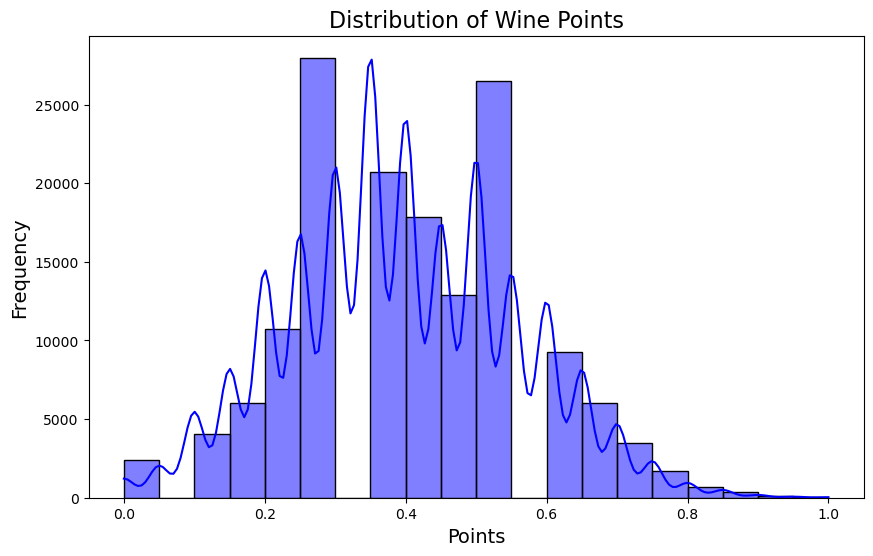

In [25]:
plt.figure(figsize=(10,6))
sns.histplot(data['points'],kde=True,bins=20,color='blue')
plt.title("Distribution of Wine Points",fontsize=16)
plt.xlabel("Points",fontsize=14)
plt.ylabel("Frequency",fontsize=14)
plt.show()

##### Insights:

###### 1. Shows how wines are rated (points).
###### 2. Most wines have points concentrated between 85 and 95.

##### 2. Top 10 Countries by Number of Wines:

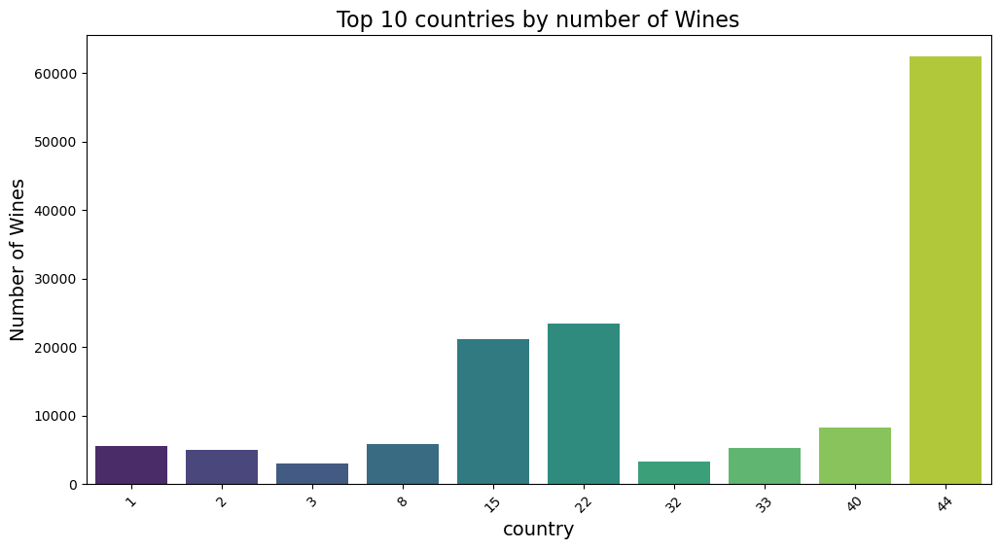

In [26]:
plt.figure(figsize=(12,6))
top_countries=data['country'].value_counts().head(10)
sns.barplot(x=top_countries.index,y=top_countries.values,palette='viridis')
plt.title("Top 10 countries by number of Wines",fontsize=16)
plt.xlabel("country",fontsize=14)
plt.ylabel("Number of Wines",fontsize=14)
plt.xticks(rotation=45)
plt.show()

##### Insights:

###### 1. Highlights countries producing the most wines.
###### 2.Likely leaders include the United States, France, and Italy.

In [27]:
data.head(2)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,44,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,0.8,0.100610,51,Napa Valley,Napa,70,Heitz
1,1,40,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,0.8,0.046167,274,Toro,NaN,553,Bodega Carmen Rodríguez


##### 3. Price Distribution (With outliers):

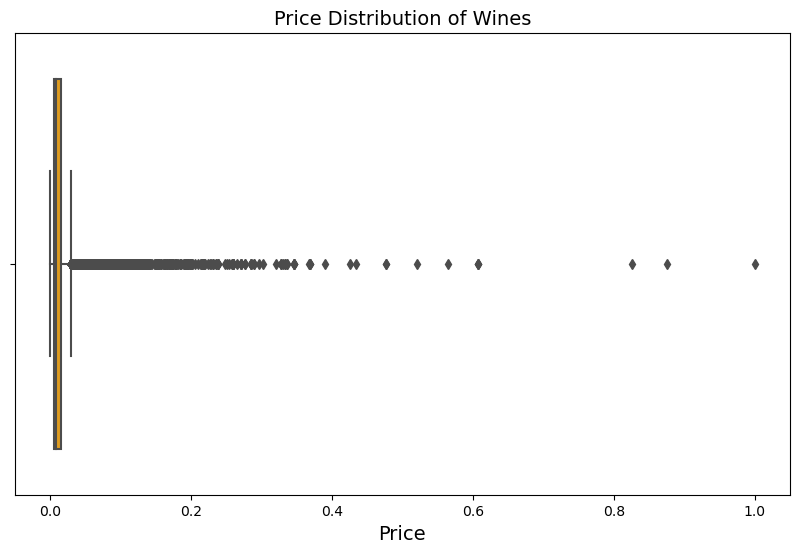

In [28]:
plt.figure(figsize=(10,6))
sns.boxplot(x=data['price'],color='orange')
plt.title("Price Distribution of Wines",fontsize=14)
plt.xlabel("Price",fontsize=14)
plt.show()

##### Insights:

###### 1. Boxplot reveals the price range and potential outliers.
###### 2. Most wines are priced under a certain threshold, but there are significant outliers in the high-price range.

##### 4. Correlation Heatmap

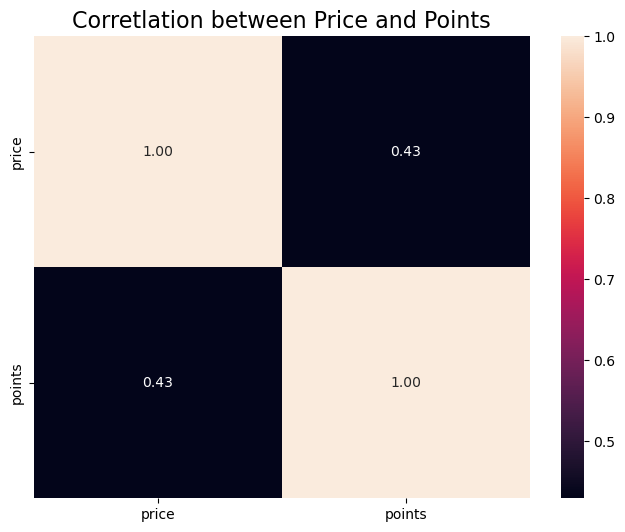

In [29]:
plt.figure(figsize=(8,6))
sns.heatmap(data[['price','points']].corr(),annot=True,color='blue',fmt=".2f")
plt.title("Corretlation between Price and Points",fontsize=16)
plt.show()

##### Insights:

###### 1. Heatmap highlights the relationship between price and points.
###### 2. Moderate positive correlation indicates higher-rated wines may be more expensive.

##### 5. Price vs Points Scatterplot

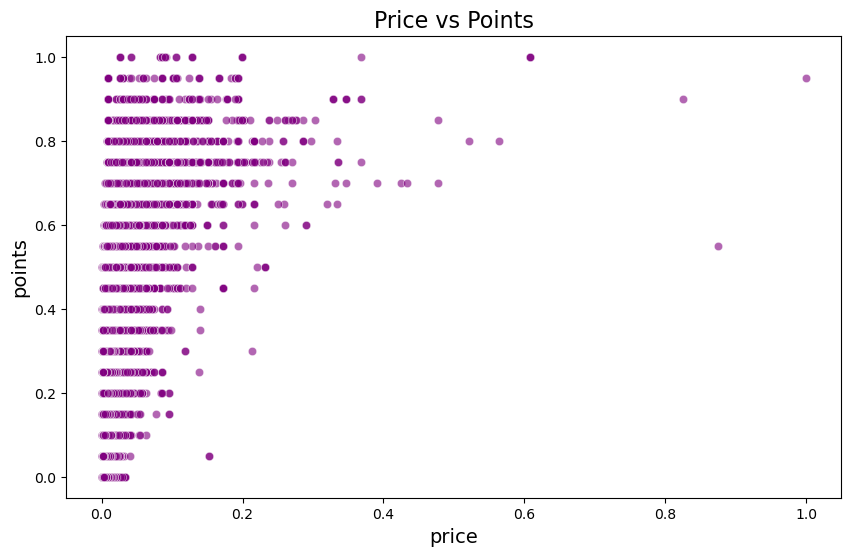

In [30]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=data['price'],y=data['points'],alpha=0.6,color='purple');
plt.title("Price vs Points",fontsize=16)
plt.xlabel('price',fontsize=14)
plt.ylabel('points',fontsize=14)
plt.show()

##### Insights:

###### There is a slight positive relationship between price and points. Higher-rated wines tend to be more expensive, but there is considerable variability.

##### 6. Word Cloud Visualization:

###### Generated a word cloud to visualize the most frequently occurring words in the `description` column of the dataset.

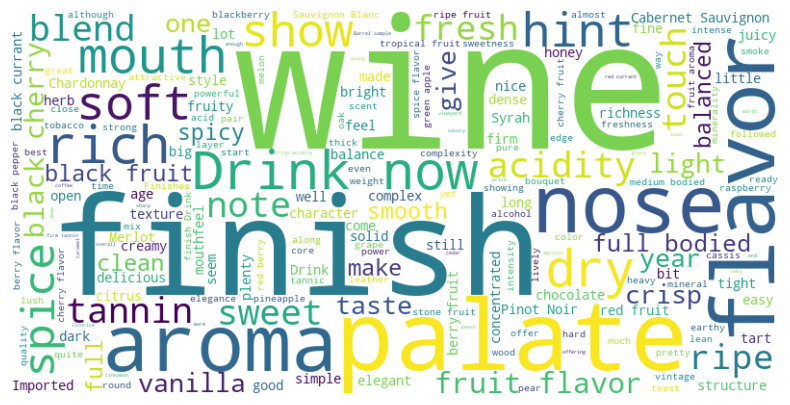

In [45]:
# Importing WordCloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combines all descriptions into a single string
text = " ".join(data['description'].dropna())

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# To Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide axis
# plt.title('Wine Descriptions Word Cloud', fontsize=16)
plt.show()


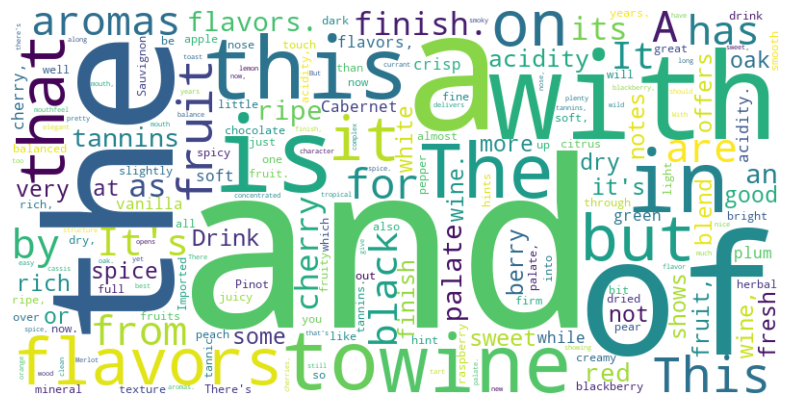

In [44]:
from collections import Counter

# Count word frequencies
words = " ".join(data['description'].dropna()).split()
word_frequencies = Counter(words)

# Generate word cloud with specific frequencies
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_frequencies)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [33]:
word_frequencies

Counter({'and': 403887,
         'the': 202916,
         'a': 185678,
         'of': 183978,
         'with': 147472,
         'is': 110637,
         'this': 71326,
         'in': 71049,
         'to': 63669,
         'wine': 60460,
         'The': 55250,
         'flavors': 45753,
         'but': 44439,
         'that': 43791,
         'on': 43314,
         'it': 39234,
         'This': 37965,
         'fruit': 36255,
         'A': 29614,
         'for': 28660,
         'aromas': 27586,
         'are': 26834,
         'from': 26591,
         'has': 26521,
         'by': 26288,
         "It's": 23811,
         'black': 23541,
         'It': 21959,
         'finish.': 20641,
         'its': 20391,
         'cherry': 20038,
         'as': 20007,
         'flavors.': 19673,
         'an': 19269,
         'ripe': 19087,
         'palate': 19039,
         'tannins': 18262,
         'red': 17361,
         'acidity': 17184,
         "it's": 15415,
         'Drink': 15178,
         'wine,': 14

In [34]:
print(data['description'][0])

This tremendous 100% varietal wine hails from Oakville and was aged over three years in oak. Juicy red-cherry fruit and a compelling hint of caramel greet the palate, framed by elegant, fine tannins and a subtle minty tone in the background. Balanced and rewarding from start to finish, it has years ahead of it to develop further nuance. Enjoy 2022–2030.


In [35]:
import yake

# Initialize YAKE
kw_extractor = yake.KeywordExtractor()

# Extract keywords from a sample description
keywords = kw_extractor.extract_keywords(data['description'][0])

# Print extracted keywords
print("Keywords:", keywords)


Keywords: [('varietal wine hails', 0.003362976569164896), ('hails from Oakville', 0.012478862015480523), ('varietal wine', 0.019799057507856037), ('wine hails', 0.027289755378363832), ('Oakville', 0.07561982617665108), ('Juicy red-cherry fruit', 0.0761110126096726), ('years in oak', 0.09862381851396108), ('subtle minty tone', 0.10212241863279987), ('framed by elegant', 0.11373644661263886), ('tremendous', 0.11911777373743597), ('varietal', 0.11911777373743597), ('oak', 0.11911777373743597), ('Juicy red-cherry', 0.1480091236040783), ('greet the palate', 0.1480091236040783), ('fine tannins', 0.1480091236040783), ('wine', 0.16298714139248702), ('hails', 0.16298714139248702), ('aged', 0.16298714139248702), ('years', 0.18772412562804305), ('red-cherry fruit', 0.19441208620319034)]


In [36]:
data.head(2)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,44,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,0.8,0.100610,51,Napa Valley,Napa,70,Heitz
1,1,40,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,0.8,0.046167,274,Toro,NaN,553,Bodega Carmen Rodríguez


##### Comparison by Attributes:

In [37]:
# First we will group the description column with any attribute of our choice.
# Group descriptions by the Country attribute. Here we are using the country column for grouping.

grouped_descriptions = data.groupby('country')['description'].apply(lambda x: " ".join(x))

# View the aggregated descriptions
print(grouped_descriptions)

country
0     This garnet-colored wine made from 100% Kallme...
1     Concentrated, ripe blackberry and cassis aroma...
2     Moorooduc's estate Pinot Noir is a solid value...
3     Pepper and cinnamon strike first, before beaut...
4     A mix of red and black fruits pervade on the n...
5     Cherry, plum and earth aromas form a sound bou...
6     This Bulgarian Mavrud presents the nose with s...
7     This Bordeaux-style blend is comprised of 44% ...
8     Lightly herbal, horsey aromas of blueberry, bl...
9     Toasted oak and candy on the nose lead into fl...
10    This Croatian white is a blend of Debit, Pošip...
11    Cyprus's historic dessert wine is well represe...
12    Intense floral and yellow peach aromas mingle ...
13    Ripe pear, apple and tropical fruit in the nos...
14    Gentle white blossom, white currant and Golden...
15    This is the top wine from La Bégude, named aft...
16    From it's musky, perfumed to nose to it's inte...
17    Juicy, sun-kissed grapefruits and 

In [38]:
grouped_descriptions.shape

(49,)

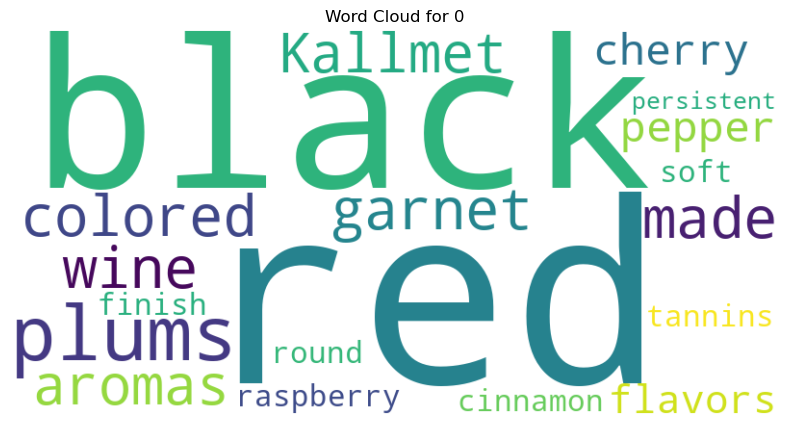

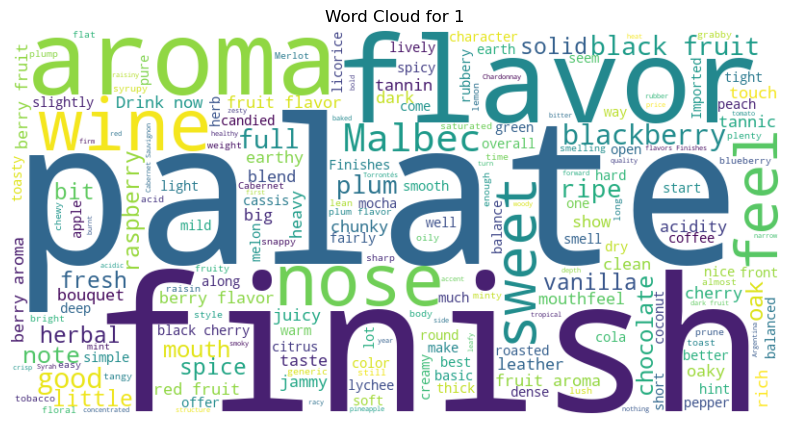

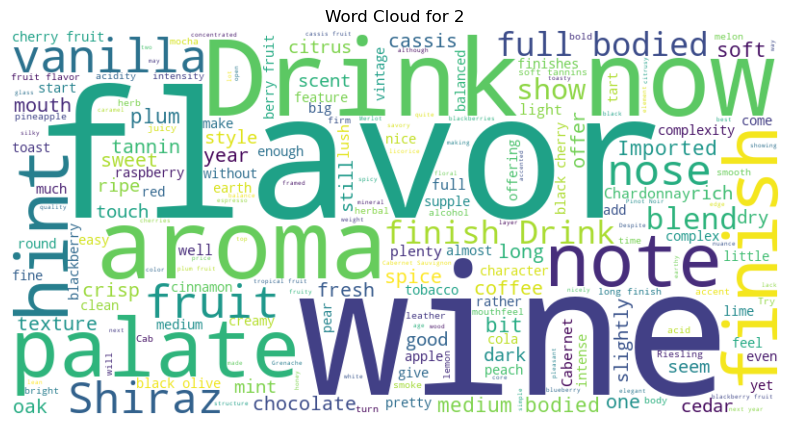

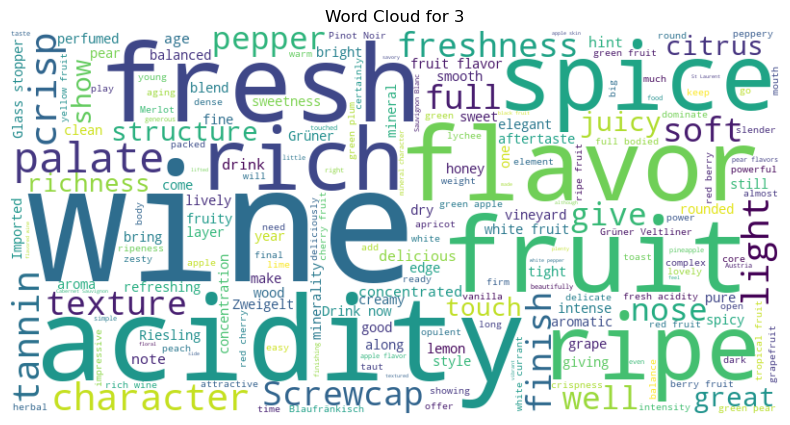

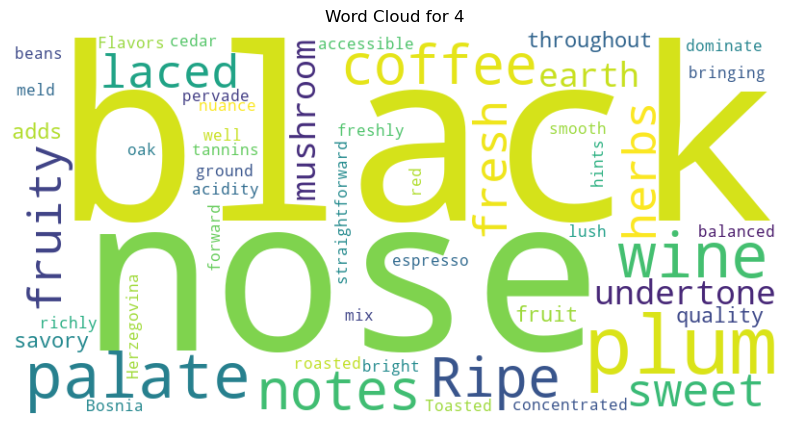

...

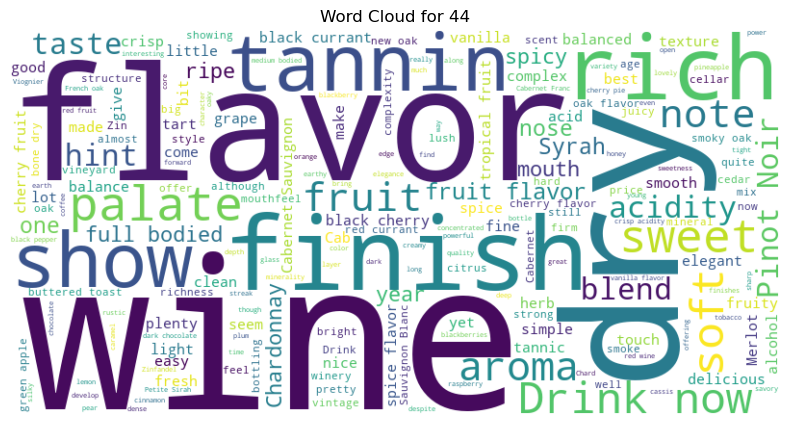

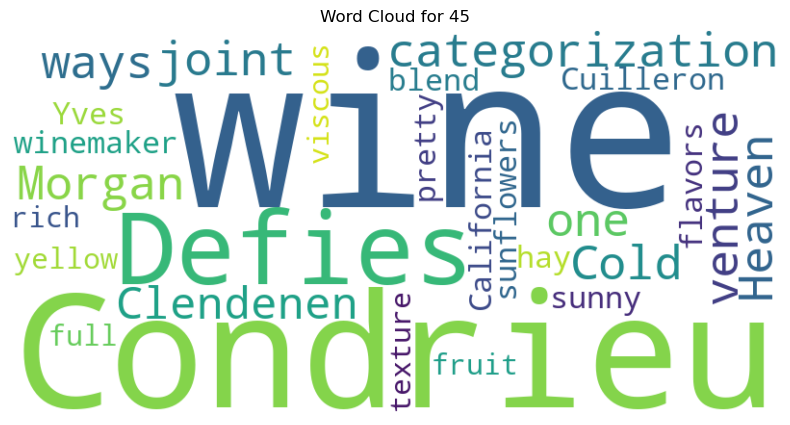

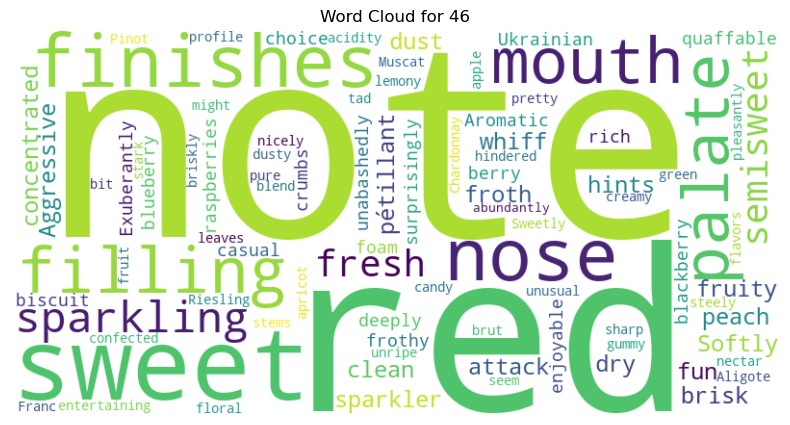

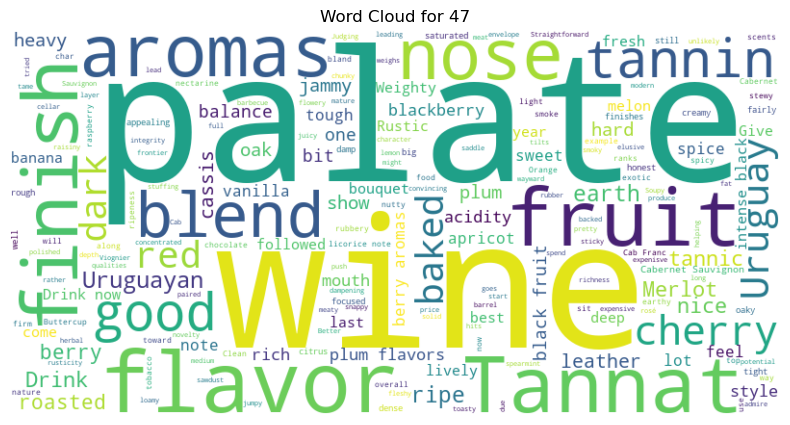

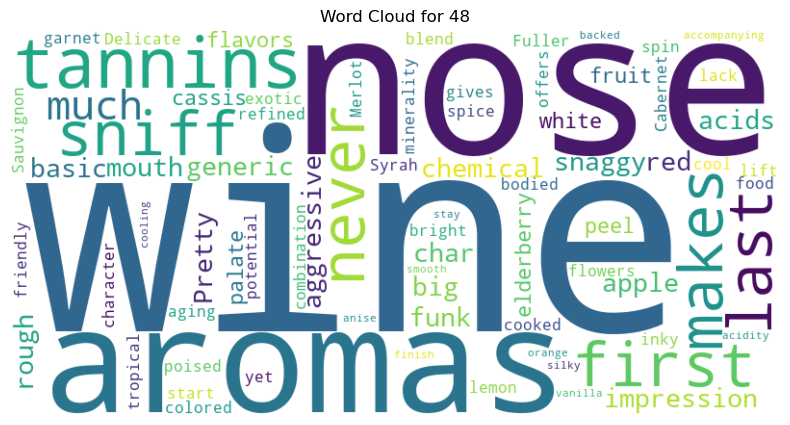

In [39]:
# We will do the Word cloud comparison now.
# It will generates word clouds for each group of wine descriptions based on the country of origin.

from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word clouds for each group
for country, description in grouped_descriptions.items():
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(description)
    plt.figure(figsize=(10, 5))
    plt.title(f"Word Cloud for {country}")
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

##### Insights:

###### 1. Highlights the most frequently used words in descriptions from different countries.
###### 2. For example, wines from France might emphasize "elegance" and "terroir," while U.S., Turkey wines might mention "oak" or "bold flavors."